# Predicting Telcom Customer Churn Rate - A Case Study

Created by: Kendrick

## What is Customer Churn?

Customer churn, also known as customer retention, customer turnover, or customer defection, is the loss of clients or customers.

Telephone service companies, Internet service providers, pay TV companies, insurance firms, and alarm monitoring services, often use customer attrition analysis and customer attrition rates as one of their key business metrics because the cost of retaining an existing customer is far less than acquiring a new one. Companies from these sectors often have customer service branches which attempt to win back defecting clients, because recovered long-term customers can be worth much more to a company than newly recruited clients.

Customers in the telecom industry can choose from a variety of service providers and actively switch from one to the next. The telecommunications business has an annual churn rate of 15-25 percent in this highly competitive market.

Individualized customer retention is tough because most firms have a large number of customers and can't afford to devote much time to each of them. The costs would be too great, outweighing the additional revenue. However, if a corporation could forecast which customers are likely to leave ahead of time, it could focus customer retention efforts only on these "high risk" clients. The ultimate goal is to expand its coverage area and retrieve more customers loyalty. The core to succeed in this market lies in the customer itself.

Customer churn is a critical metric because it is much less expensive to retain existing customers than it is to acquire new customers.

Companies usually make a distinction between voluntary churn and involuntary churn. Voluntary churn occurs due to a decision by the customer to switch to another company or service provider, involuntary churn occurs due to circumstances such as a customer's relocation to a long-term care facility, death, or the relocation to a distant location. In most applications, involuntary reasons for churn are excluded from the analytical models. Analysts tend to concentrate on voluntary churn, because it typically occurs due to factors of the company-customer relationship which companies control, such as how billing interactions are handled or how after-sales help is provided.

predictive analytics use churn prediction models that predict customer churn by assessing their propensity of risk to churn. Since these models generate a small prioritized list of potential defectors, they are effective at focusing customer retention marketing programs on the subset of the customer base who are most vulnerable to churn.

## Objectives:
Finding the % of Churn Customers and customers that keep in with the active services.
Analysing the data in terms of various features responsible for customer Churn
Finding a most suited machine learning model for correct classification of Churn and non churn customers.


## The Dataset

About Telecom Churn Dataset
Each row represents a customer; each column contains customer’s attributes. The datasets have the following attributes or features:

State: string
Account length: integer
Area code: integer
International plan: string
Voice mail plan: string
Number vmail messages: integer
Total day minutes: double
Total day calls: integer
Total day charge: double
Total eve minutes: double
Total eve calls: integer
Total eve charge: double
Total night minutes: double
Total night calls: integer
Total night charge: double
Total intl minutes: double
Total intl calls: integer
Total intl charge: double
Customer service calls: integer
Churn: string
The "churn-bigml-80" dataset contains 2666 rows (customers) and 20 columns (features).
The "Churn" column is the target to predict.

### 1. Data Cleaning and Exploration

data types, missing values, distributions, outliers, skewness, relations with label

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import seaborn as sns

!pip install imbalanced-learn
!pip install pandas-profiling
!pip install pydantic==1.8.2
!pip install scikit-plot
!pip install eli5
!pip install --upgrade ydata-profiling pydantic


from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, roc_auc_score

from ydata_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from imblearn.over_sampling import RandomOverSampler, SMOTE
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline

import scikitplot as skplt

  Using cached pydantic-1.8.2-cp39-cp39-win_amd64.whl (1.9 MB)
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.10.13
    Uninstalling pydantic-1.10.13:
      Successfully uninstalled pydantic-1.10.13
  Using cached pydantic-2.4.2-py3-none-any.whl (395 kB)
  Using cached pydantic-1.10.13-cp39-cp39-win_amd64.whl (2.2 MB)
  Attempting uninstall: pydantic
    Found existing installation: pydantic 1.8.2
    Uninstalling pydantic-1.8.2:
      Successfully uninstalled pydantic-1.8.2


In [2]:
train = pd.read_csv(r'D:\Python Things\LUX_Academy\churn-bigml-80.csv')
test = pd.read_csv(r'D:\Python Things\LUX_Academy\churn-bigml-20.csv')

In [3]:
train.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [4]:
test.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   2666 non-null   object 
 1   Account length          2666 non-null   int64  
 2   Area code               2666 non-null   int64  
 3   International plan      2666 non-null   object 
 4   Voice mail plan         2666 non-null   object 
 5   Number vmail messages   2666 non-null   int64  
 6   Total day minutes       2666 non-null   float64
 7   Total day calls         2666 non-null   int64  
 8   Total day charge        2666 non-null   float64
 9   Total eve minutes       2666 non-null   float64
 10  Total eve calls         2666 non-null   int64  
 11  Total eve charge        2666 non-null   float64
 12  Total night minutes     2666 non-null   float64
 13  Total night calls       2666 non-null   int64  
 14  Total night charge      2666 non-null   

In [6]:
len(train)

2666

In [7]:
train.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [8]:
#convert area code to category
train['Area code'] = train['Area code'].astype('category')

In [9]:
numerical_column = []
catagorical_column = []
for column in train.columns:
    if train[column].dtypes == 'float64' or train[column].dtypes == 'int64':
        numerical_column.append(column)
    else:
        catagorical_column.append(column)
print(numerical_column)
print(catagorical_column)

['Account length', 'Number vmail messages', 'Total day minutes', 'Total day calls', 'Total day charge', 'Total eve minutes', 'Total eve calls', 'Total eve charge', 'Total night minutes', 'Total night calls', 'Total night charge', 'Total intl minutes', 'Total intl calls', 'Total intl charge', 'Customer service calls']
['State', 'Area code', 'International plan', 'Voice mail plan', 'Churn']


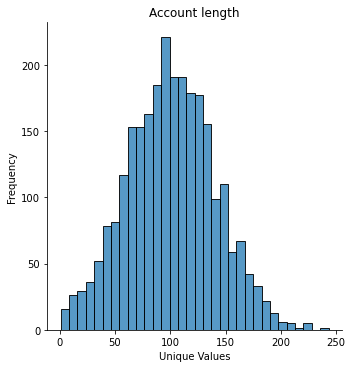

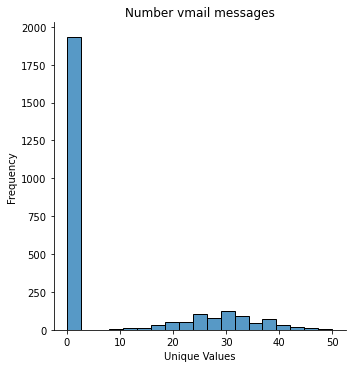

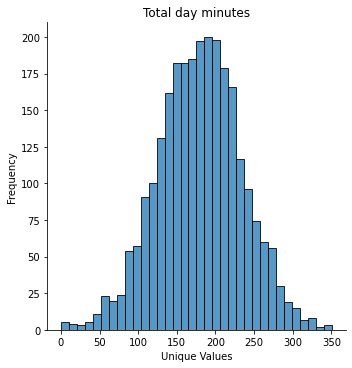

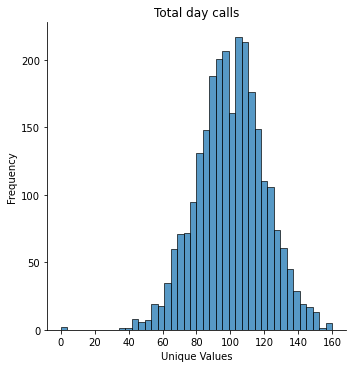

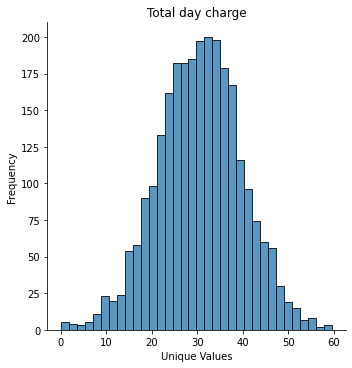

...

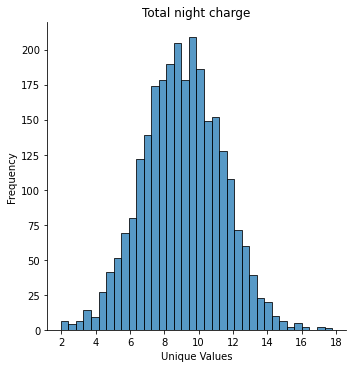

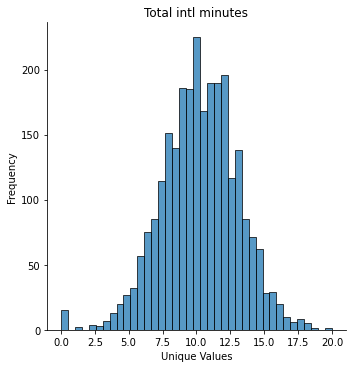

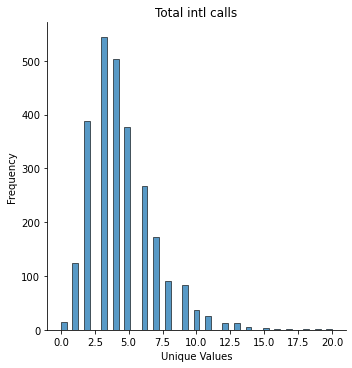

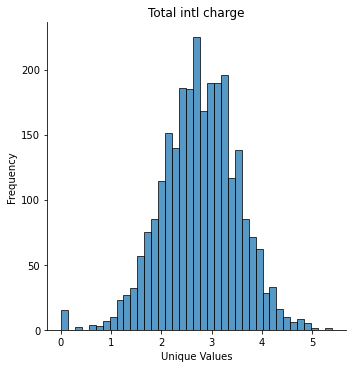

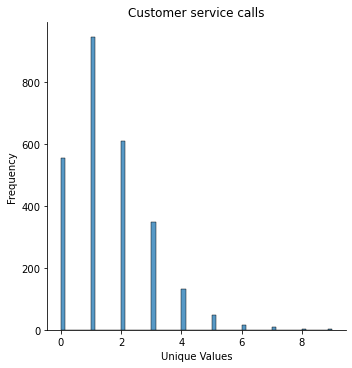

In [10]:
# Iterate over the columns
for column in numerical_column:
    # Create a bar plot
    sns.displot(data=train, x=column)
    plt.title(column)
    plt.xlabel("Unique Values")
    plt.ylabel("Frequency")
    plt.show()

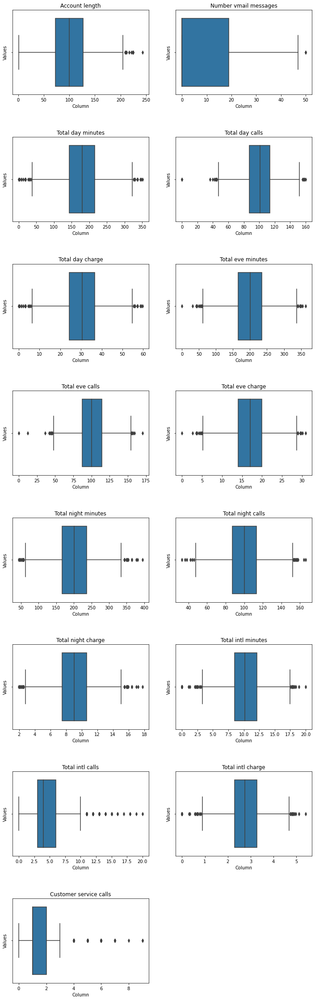

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'train' is your DataFrame and 'numerical_column' is the list of numerical columns
num_cols = len(numerical_column)
num_rows = (num_cols + 1) // 2  # Calculate the number of rows for the subplot

fig, axs = plt.subplots(num_rows, 2, figsize=(12, 5*num_rows))
plt.subplots_adjust(hspace=0.5)  # Adjust the vertical space between subplots

for idx, column in enumerate(numerical_column):
    row_idx = idx // 2  # Calculate the row index for the subplot
    col_idx = idx % 2  # Calculate the column index for the subplot

    sns.boxplot(data=train, x=column, ax=axs[row_idx, col_idx])
    axs[row_idx, col_idx].set_title(column)
    axs[row_idx, col_idx].set_xlabel("Column")
    axs[row_idx, col_idx].set_ylabel("Values")

# In case there's an odd number of columns, leave the last subplot empty
if num_cols % 2 != 0:
    axs[num_rows - 1, 1].axis('off')

plt.show()

## Notes

1. no obvious skew data
2. outliers exist, but keep them first to see if the outlier boundary can apply as classification boundary

Hint:

1. outlier would be sensitive to regression, linear discriminate analysis, deep learning, as they 'assume' a normal distribution and are thus sensitive to outliers
2. perform a power/log/boxcox transformation on the feature in order to have its distribution come closer to 'normal' or Gaussian distribution
3. discretize/bin the numercal value such that nullifies the effect of an outlier
4. choose an algo that isn't sensitive to outliers - a tree based model
5. implement on robust scaler on columns that have significant outliers

1. Account length, Number vmail messages, Total day calls, Total eve charge, Total night minutes, Total intl calls
2. above can be considered to drop as low

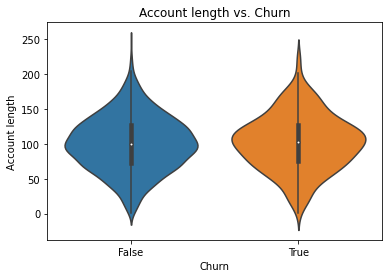

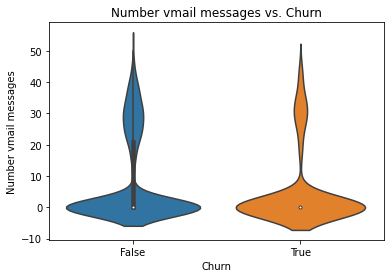

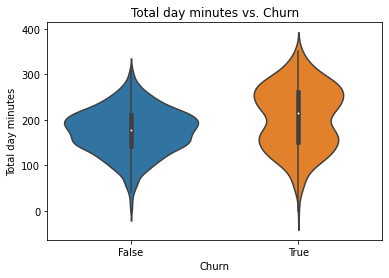

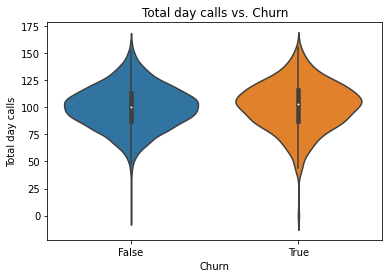

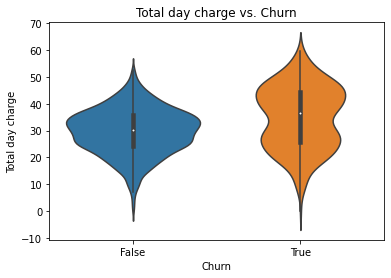

...

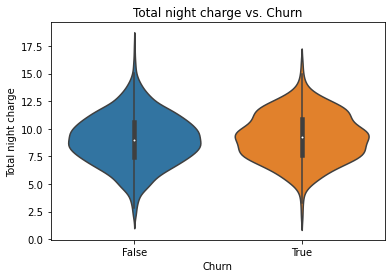

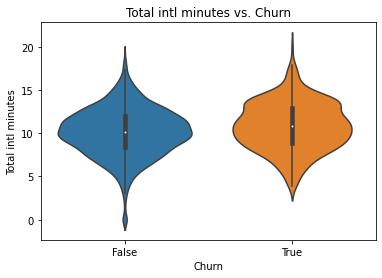

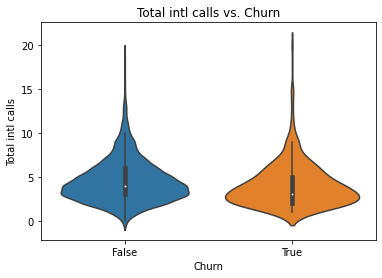

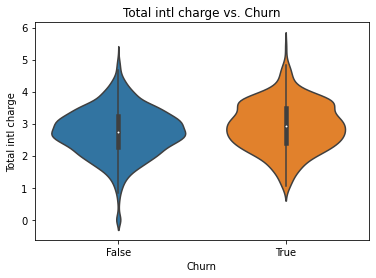

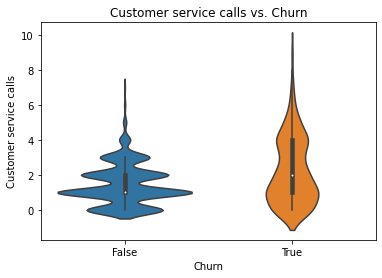

In [12]:
for column in numerical_column:
    # Create a violin plot with 'Churn' as the x-axis
    sns.violinplot(data=train, x='Churn', y=column)
    plt.title(f'{column} vs. Churn')
    plt.xlabel('Churn')
    plt.ylabel(column)
    plt.show()

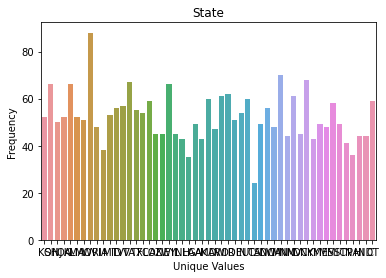

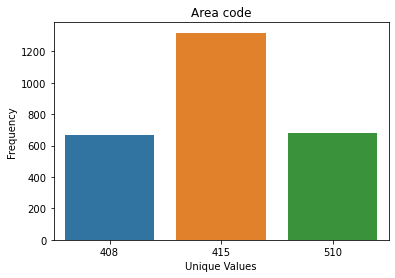

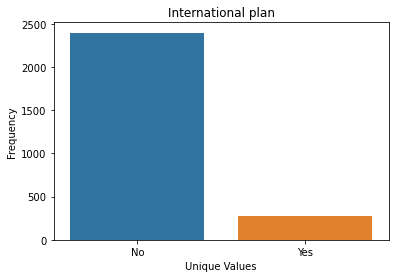

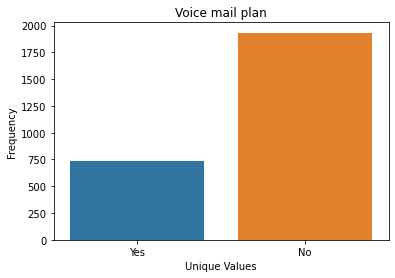

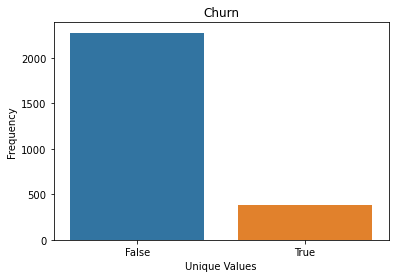

In [13]:
# Iterate over the columns
for column in catagorical_column:
    # Create a bar plot
    sns.countplot(data=train, x=column)
    plt.title(column)
    plt.xlabel("Unique Values")
    plt.ylabel("Frequency")
    plt.show()

In [14]:
# Churn is the label
catagorical_column.remove('Churn')

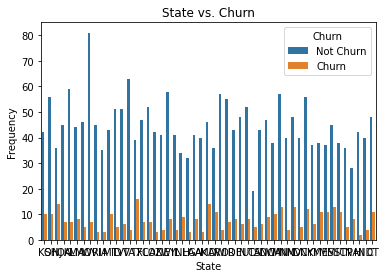

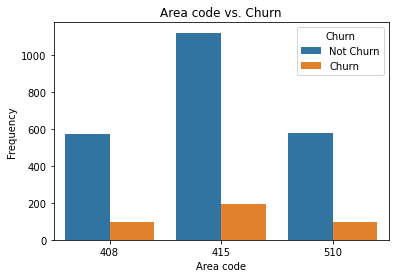

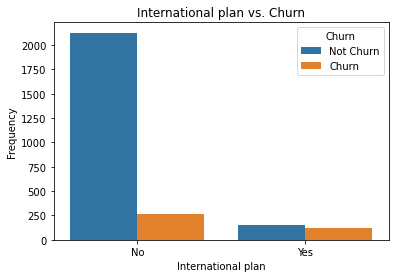

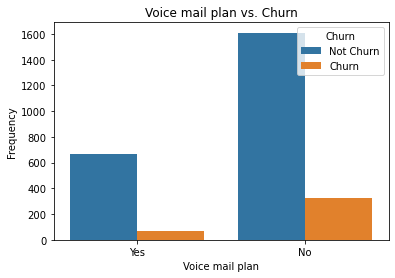

In [15]:
for column in catagorical_column:
    # Create a countplot with 'Churn' as hue
    sns.countplot(data=train, x=column, hue='Churn')
    plt.title(f'{column} vs. Churn')
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.legend(title='Churn', loc='upper right', labels=['Not Churn', 'Churn'])  # Add a legend
    plt.show()

## 2. New Features and Feature Selection

We remove state as it doesn't show trend with churn

In [16]:
# drop state
catagorical_column.remove('State')

In [17]:
catagorical_column

['Area code', 'International plan', 'Voice mail plan']

In [18]:
numerical_column

['Account length',
 'Number vmail messages',
 'Total day minutes',
 'Total day calls',
 'Total day charge',
 'Total eve minutes',
 'Total eve calls',
 'Total eve charge',
 'Total night minutes',
 'Total night calls',
 'Total night charge',
 'Total intl minutes',
 'Total intl calls',
 'Total intl charge',
 'Customer service calls']

In [19]:
#use chi-square test to see the correlation between 'Churn' and other categorical features
from scipy.stats import chi2_contingency
from scipy import stats

for col in catagorical_column:
    if col != 'Churn':
        contingency_table = pd.crosstab(train[col], train['Churn'])
        stat, p, dof, expected = chi2_contingency(contingency_table)
        print(col, p)
# p-values less than 0.05

Area code 0.9056446754773072
International plan 5.4269405491147075e-46
Voice mail plan 4.079713016862758e-07


If a feature has a very low p-value (e.g., close to zero or below a significance level like 0.05), it suggests that there is a significant association between that feature and the likelihood of "Churn." In other words, the feature has predictive power in determining whether a customer will churn or not.

On the other hand, if a feature has a high p-value (e.g., close to 1 or greater than 0.05), it indicates that the feature may not have a significant impact on the target variable "Churn." In this case, the feature may not be a strong predictor of customer churn.

<AxesSubplot:xlabel='Feature', ylabel='P-value'>

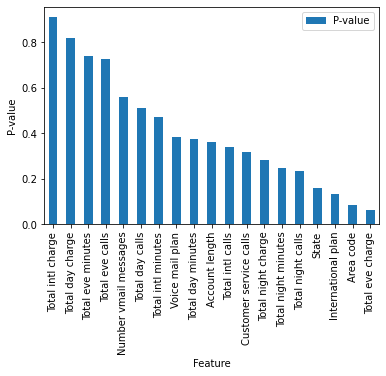

In [20]:
from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# Convert categorical variables to integer-coded labels
encoder = LabelEncoder()
for col in catagorical_column:
    if col != 'Churn':
        train[col] = encoder.fit_transform(train[col])

# Create the feature matrix (X) and target vector (y)
X = train.drop('Churn', axis=1)
y = train['Churn']

# Apply one-hot encoding to handle categorical data
ohe = OneHotEncoder()
X_encoded = ohe.fit_transform(X)

# Apply chi2 test
chi2_scores, p_values = chi2(X_encoded, y)

# Create a list of dictionaries to store the data
data = []
for i, col in enumerate(X.columns):
    data.append({'Feature': col, 'P-value': p_values[i]})

# Convert the list of dictionaries into a dataframe
df_p_values = pd.DataFrame(data)

df_p_values.sort_values(by='P-value', ascending = False).plot(kind = 'bar', x = 'Feature', ylabel = 'P-value')

Higher importance values indicate more significant features, while lower values indicate less significance.

## 3. Define features and label

In [21]:
X = train.drop(columns = ['State', 'Churn'])
y = train['Churn']

In [22]:
X.head()

,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,1,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,1,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,1,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,0,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,1,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


In [23]:
profile = ProfileReport(train, title="EDA Report", explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [29]:
X.corr().style.background_gradient(cmap='coolwarm', axis=None)

,Account length,Area code,International plan,Voice mail plan,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls
Account length,1.000000,-0.007364,0.024500,0.002448,0.038862,0.002843,0.018552,-0.015909,-0.024007,-0.008999,0.017627,0.011383,0.002455
Area code,-0.007364,1.000000,0.045439,0.012111,-0.013676,-0.003270,-0.004246,-0.004064,0.033309,0.006660,-0.009167,0.008358,0.036364
International plan,0.024500,0.045439,1.000000,0.002131,-0.004277,0.049555,0.010277,0.026623,0.018081,-0.010316,0.011549,0.053037,-0.035955
Voice mail plan,0.002448,0.012111,0.002131,1.000000,-0.007541,0.013439,0.003404,0.019147,0.013985,0.001066,0.015196,-0.013931,-0.022054
Total day calls,0.038862,-0.013676,-0.004277,-0.007541,1.000000,0.016787,0.006473,-0.026006,-0.016776,0.008972,0.006928,0.031133,-0.011945
Total day charge,0.002843,-0.003270,0.049555,0.013439,0.016787,1.000000,0.009056,0.004002,0.015057,0.013468,0.005688,-0.010938,-0.024548
Total eve calls,0.018552,-0.004246,0.010277,0.003404,0.006473,0.009056,1.000000,-0.007642,0.000797,-0.000135,0.003710,0.011000,0.001058
Total eve charge,-0.015909,-0.004064,0.026623,0.019147,-0.026006,0.004002,-0.007642,1.000000,0.009030,-0.013464,0.002169,-0.006955,-0.013196
Total night calls,-0.024007,0.033309,0.018081,0.013985,-0.016776,0.015057,0.000797,0.009030,1.000000,0.012720,0.019367,-0.023434,-0.005677
Total night charge,-0.008999,0.006660,-0.010316,0.001066,0.008972,0.013468,-0.000135,-0.013464,0.012720,1.000000,-0.001099,-0.008517,0.005257


In [30]:
# train test split
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.33, random_state=42)

In [32]:
X_train.shape

(1786, 13)

In [33]:
y_train.shape

(1786,)

In [34]:
X_val.shape

(880, 13)

In [35]:
y_val.shape

(880,)

### 4. Baseline model

In [36]:
X.head()

,Account length,Area code,International plan,Voice mail plan,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls
0,128,1,0,1,110,45.07,99,16.78,91,11.01,3,2.70,1
1,107,1,0,1,123,27.47,103,16.62,103,11.45,3,3.70,1
2,137,1,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0
3,84,0,1,0,71,50.90,88,5.26,89,8.86,7,1.78,2
4,75,1,1,0,113,28.34,122,12.61,121,8.41,3,2.73,3


In [37]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2666 entries, 0 to 2665
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Account length          2666 non-null   int64  
 1   Area code               2666 non-null   int64  
 2   International plan      2666 non-null   int32  
 3   Voice mail plan         2666 non-null   int32  
 4   Total day calls         2666 non-null   int64  
 5   Total day charge        2666 non-null   float64
 6   Total eve calls         2666 non-null   int64  
 7   Total eve charge        2666 non-null   float64
 8   Total night calls       2666 non-null   int64  
 9   Total night charge      2666 non-null   float64
 10  Total intl calls        2666 non-null   int64  
 11  Total intl charge       2666 non-null   float64
 12  Customer service calls  2666 non-null   int64  
dtypes: float64(4), int32(2), int64(7)
memory usage: 250.1 KB


In [38]:
X.columns

Index(['Account length', 'Area code', 'International plan', 'Voice mail plan',
       'Total day calls', 'Total day charge', 'Total eve calls',
       'Total eve charge', 'Total night calls', 'Total night charge',
       'Total intl calls', 'Total intl charge', 'Customer service calls'],
      dtype='object')

In [39]:
X_train.shape

(1786, 13)

In [40]:
X_val.shape

(880, 13)

In [41]:
categorical_features = ['Area code', 'International plan', 'Voice mail plan']
numerical_features = ['Account length', 'Total day calls', 'Total day charge', 'Total eve calls',
       'Total eve charge', 'Total night calls', 'Total night charge',
       'Total intl calls', 'Total intl charge', 'Customer service calls']

### 4.1 Logistic regression

In [42]:
# Separate the categorical and numerical features for training and validation data
X_train_categorical = X_train[categorical_features]
X_train_numerical = X_train[numerical_features]

X_val_categorical = X_val[categorical_features]
X_val_numerical = X_val[numerical_features]

# OneHotEncoder for categorical features
encoder = OneHotEncoder()
X_train_encoded = encoder.fit_transform(X_train_categorical)
X_val_encoded = encoder.transform(X_val_categorical)

# StandardScaler for numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_numerical)
X_val_scaled = scaler.transform(X_val_numerical)  # Use X_val_numerical instead of X_val_encoded

# Concatenate the encoded categorical features and scaled numerical features back together
X_train_processed = np.hstack((X_train_encoded.toarray(), X_train_scaled))
X_val_processed = np.hstack((X_val_encoded.toarray(), X_val_scaled))

# Apply SMOTE only to the training data
sampler = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = sampler.fit_resample(X_train_processed, y_train)

# Create the logistic regression model
lr = LogisticRegression(random_state=42)

# Fit the logistic regression model on the preprocessed training data
lr.fit(X_train_resampled, y_train_resampled)

# Make predictions on the preprocessed validation data
y_pred_val = lr.predict(X_val_processed)

# Output the classification report to evaluate the model's performance
print(classification_report(y_val, y_pred_val))

              precision    recall  f1-score   support

       False       0.93      0.76      0.83       751
        True       0.32      0.67      0.43       129

    accuracy                           0.74       880
   macro avg       0.63      0.71      0.63       880
weighted avg       0.84      0.74      0.78       880



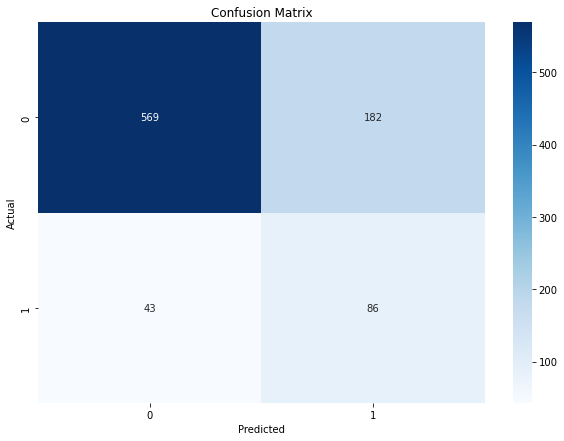

In [43]:
#create the confusion matrix for Logistic Regression
cm = confusion_matrix(y_val, y_pred_val)

# Plot the confusion matrix
plt.figure(figsize=(10,7))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### 4.2 Make pipeline

In [44]:
cata_pipeline = Pipeline([
    ('one_hot', OneHotEncoder())
])

num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', cata_pipeline, categorical_features),
        ('num', num_pipeline, numerical_features)
    ],
    remainder='passthrough'
    )

pipe = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('smote', SMOTE()),
        ('model', LogisticRegression())
    ])
# fit the pipeline to the training data
pipe.fit(X_train, y_train)

# predict on test data
y_pred = pipe.predict(X_val)

print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

       False       0.94      0.75      0.83       751
        True       0.32      0.70      0.44       129

    accuracy                           0.74       880
   macro avg       0.63      0.72      0.64       880
weighted avg       0.85      0.74      0.78       880



### 4.3 Cross Validation

In [45]:
cata_pipeline = Pipeline([
    ('one_hot', OneHotEncoder())
])

num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', cata_pipeline, categorical_features),
        ('num', num_pipeline, numerical_features)
    ],
    remainder='passthrough'
    )

pipe = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('smote', SMOTE()),
        ('model', LogisticRegression())
    ])
recall_scores = cross_val_score(pipe, X, y, cv=3, scoring='recall')
np.mean(recall_scores)

0.7190618167362354

### 4.3.2 Random Forest

In [46]:
cata_pipeline = Pipeline([
    ('one_hot', OneHotEncoder())
])

num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', cata_pipeline, categorical_features),
        ('num', num_pipeline, numerical_features)
    ],
    remainder='passthrough'
    )

pipe = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('smote', SMOTE()),
        ('model', RandomForestClassifier())
    ])

recall_scores = cross_val_score(pipe, X, y, cv=3, scoring='recall')
np.mean(recall_scores)

0.7369509043927649

### 4.3.3 XGBoostClassifier

In [47]:
cata_pipeline = Pipeline([
    ('one_hot', OneHotEncoder())
])

num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', cata_pipeline, categorical_features),
        ('num', num_pipeline, numerical_features)
    ],
    remainder='passthrough'
    )

pipe = Pipeline(
    steps=[('preprocessor', preprocessor),
        ('smote', SMOTE(random_state=42)),
        ('model', xgb.XGBClassifier(random_state=42))
    ])

recall_scores = cross_val_score(pipe, X, y, cv=3, scoring='recall')
np.mean(recall_scores)

0.77312661498708

In [48]:
xgb.XGBClassifier().get_params()

{'objective': 'binary:logistic',
 'use_label_encoder': False,
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

### 4.3.4 Feature Importance

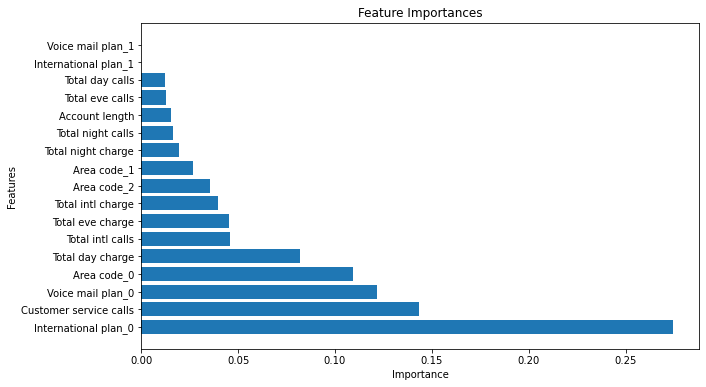

In [49]:
# Fit the pipeline on the whole training data
pipe.fit(X_train, y_train)

# Get the trained XGBoost model
model = pipe.named_steps['model']

# Get the feature names after OneHotEncoder transformation
categorical_columns = pipe.named_steps['preprocessor'].named_transformers_['cat'].named_steps['one_hot'].get_feature_names_out(input_features=categorical_features)
numerical_columns = numerical_features

# Concatenate the feature names (categorical and numerical) to get the final feature names
feature_names = np.concatenate([categorical_columns, numerical_columns])

# Get feature importances from the model
importance_scores = model.feature_importances_

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance_scores})

# Sort the DataFrame by importance scores in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances')
plt.show()

### 4.3.5 Grid Search

In [50]:
param_grid = {
    'model__max_depth': [3, 5, 7],
    'model__learning_rate': [0.01, 0.1, 0.2],
    'model__n_estimators': [50, 100, 200],
}

# Create the GridSearchCV object with the specified hyperparameters and scoring metric
grid_search = GridSearchCV(pipe, param_grid, cv=3, scoring='recall', n_jobs=-1)

# Perform grid search to find the best hyperparameters
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and best recall score found during the search
print("Best Hyperparameters: ", grid_search.best_params_)
print("Best Recall Score: ", grid_search.best_score_)

# Get the best model from the grid search
best_model = grid_search.best_estimator_

# Make predictions on the validation set using the best model
y_pred_val = grid_search.predict(X_val)

# Output the recall score on the validation set
print("Recall Score on Validation Set: ", recall_score(y_val, y_pred_val))

Best Hyperparameters:  {'model__learning_rate': 0.01, 'model__max_depth': 3, 'model__n_estimators': 200}
Best Recall Score:  0.826383319967923
Recall Score on Validation Set:  0.7984496124031008


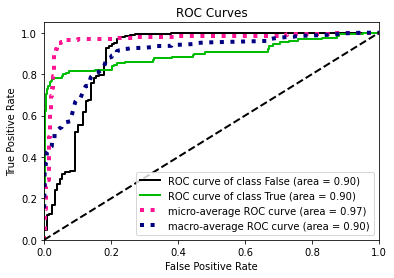

In [51]:
# Train the pipeline model on the entire dataset
pipe.fit(X_train, y_train)

# Make predictions on the validation set
y_pred_proba = pipe.predict_proba(X_val)

# Plot the ROC curve
skplt.metrics.plot_roc(y_val, y_pred_proba)
plt.show()

In [52]:
pipe['model']

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, ...)

### 5. Permutation Importance

In [53]:
# Get the one-hot encoded feature names
cata_pipeline.fit(X_train[categorical_features])
categorical_columns = cata_pipeline.named_steps['one_hot'].get_feature_names_out(input_features=categorical_features)

# Transform categorical features in X_train using the cata_pipeline and convert to dense array
X_train_cata_encoded = cata_pipeline.transform(X_train[categorical_features]).toarray()

# Get the numerical features from X_train
X_train_num = X_train[numerical_features]

# Concatenate the transformed categorical features and numerical features
X_train_encoded = np.concatenate([X_train_cata_encoded, X_train_num], axis=1)

# Now X_train_encoded will have the correct shape after one-hot encoding
print(X_train_encoded.shape[1])  # This should match len(feature_names)

17


In [54]:
import eli5
from eli5.sklearn import PermutationImportance

# Rest of your code
perm = PermutationImportance(pipe['model'], random_state=42)

In [55]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(pipe['model'], random_state=42)

perm.fit(X_train_encoded, y_train)

eli5.show_weights(perm, feature_names=feature_names)

Weight,Feature
0.0066 ± 0.0051,Voice mail plan_0
0.0052 ± 0.0018,International plan_0
0.0007 ± 0.0015,Total intl calls
0 ± 0.0000,Total day calls
0 ± 0.0000,Account length
0 ± 0.0000,Area code_1
0 ± 0.0000,Area code_2
0 ± 0.0000,International plan_1
0 ± 0.0000,Voice mail plan_1
0 ± 0.0000,Area code_0


### 5. Final model

In [56]:
X = X.drop(columns =['Customer service calls', 'Area code'])

In [57]:
train.columns

Index(['State', 'Account length', 'Area code', 'International plan',
       'Voice mail plan', 'Number vmail messages', 'Total day minutes',
       'Total day calls', 'Total day charge', 'Total eve minutes',
       'Total eve calls', 'Total eve charge', 'Total night minutes',
       'Total night calls', 'Total night charge', 'Total intl minutes',
       'Total intl calls', 'Total intl charge', 'Customer service calls',
       'Churn'],
      dtype='object')

In [58]:
X.columns.tolist()

['Account length',
 'International plan',
 'Voice mail plan',
 'Total day calls',
 'Total day charge',
 'Total eve calls',
 'Total eve charge',
 'Total night calls',
 'Total night charge',
 'Total intl calls',
 'Total intl charge']

In [59]:
X_train = X

In [60]:
X_train.columns

Index(['Account length', 'International plan', 'Voice mail plan',
       'Total day calls', 'Total day charge', 'Total eve calls',
       'Total eve charge', 'Total night calls', 'Total night charge',
       'Total intl calls', 'Total intl charge'],
      dtype='object')

In [61]:
y_train = y

In [62]:
test.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,LA,117,408,No,No,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False
1,IN,65,415,No,No,0,129.1,137,21.95,228.5,83,19.42,208.8,111,9.40,12.7,6,3.43,4,True
2,NY,161,415,No,No,0,332.9,67,56.59,317.8,97,27.01,160.6,128,7.23,5.4,9,1.46,4,True
3,SC,111,415,No,No,0,110.4,103,18.77,137.3,102,11.67,189.6,105,8.53,7.7,6,2.08,2,False
4,HI,49,510,No,No,0,119.3,117,20.28,215.1,109,18.28,178.7,90,8.04,11.1,1,3.00,1,False


In [63]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 667 entries, 0 to 666
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State                   667 non-null    object 
 1   Account length          667 non-null    int64  
 2   Area code               667 non-null    int64  
 3   International plan      667 non-null    object 
 4   Voice mail plan         667 non-null    object 
 5   Number vmail messages   667 non-null    int64  
 6   Total day minutes       667 non-null    float64
 7   Total day calls         667 non-null    int64  
 8   Total day charge        667 non-null    float64
 9   Total eve minutes       667 non-null    float64
 10  Total eve calls         667 non-null    int64  
 11  Total eve charge        667 non-null    float64
 12  Total night minutes     667 non-null    float64
 13  Total night calls       667 non-null    int64  
 14  Total night charge      667 non-null    fl

In [64]:
X_test = test[['Account length', 'International plan', 'Voice mail plan', 'Total day calls', 'Total day charge',
 'Total eve calls', 'Total eve charge', 'Total night calls', 'Total night charge', 'Total intl calls', 'Total intl charge']]

In [65]:
y_test = test['Churn']

In [66]:
categorical_features = ['International plan', 'Voice mail plan']
numerical_features = ['Account length', 'Total day calls', 'Total day charge', 'Total eve calls',
       'Total eve charge', 'Total night calls', 'Total night charge',
       'Total intl calls', 'Total intl charge']

cata_pipeline = Pipeline([
    ('one_hot', OneHotEncoder(handle_unknown='ignore'))
])

num_pipeline = Pipeline([
    ('scaler', StandardScaler())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('cat', cata_pipeline, categorical_features),
        ('num', num_pipeline, numerical_features)
    ],
    remainder='passthrough'
    )
pipe = Pipeline(
    steps=[
        ('preprocessor', preprocessor),
        ('smote', SMOTE(random_state=42)),
        ('model', xgb.XGBClassifier(learning_rate=0.01, max_depth=3, n_estimators=200, random_state=42))
    ])

# fit the pipeline to the training data
pipe.fit(X_train, y_train)

# predict on test data
y_pred = pipe.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.93      0.41      0.57       572
        True       0.19      0.82      0.31        95

    accuracy                           0.47       667
   macro avg       0.56      0.62      0.44       667
weighted avg       0.83      0.47      0.53       667



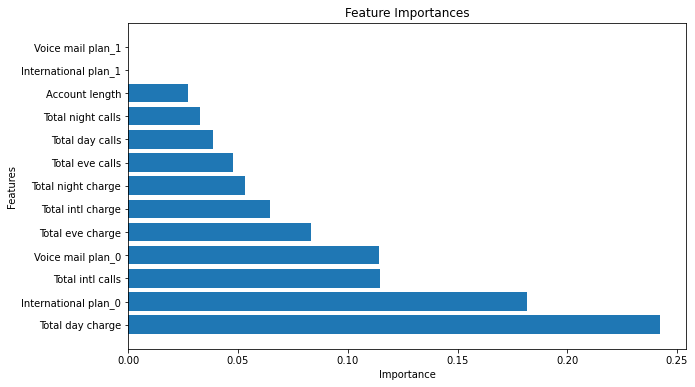

In [67]:
# Fit the pipeline on the whole training data
pipe.fit(X_train, y_train)

# Get the trained XGBoost model
model = pipe.named_steps['model']

# Get the feature names after OneHotEncoder transformation
categorical_columns = pipe.named_steps['preprocessor'].named_transformers_['cat'].named_steps['one_hot'].get_feature_names_out(input_features=categorical_features)
numerical_columns = numerical_features

# Concatenate the feature names (categorical and numerical) to get the final feature names
feature_names = np.concatenate([categorical_columns, numerical_columns])

# Get feature importances from the model
importance_scores = model.feature_importances_

# Create a DataFrame with feature names and their importance scores
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance_scores})

# Sort the DataFrame by importance scores in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances')
plt.show()

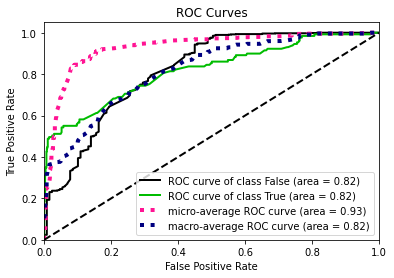

In [68]:
# Train the pipeline model on the entire dataset
pipe.fit(X_train, y_train)

# Make predictions on the validation set
y_pred_proba = pipe.predict_proba(X_val)

# Plot the ROC curve
skplt.metrics.plot_roc(y_val, y_pred_proba)
plt.show()